In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os 
import cv2 as cv
import glob

In [3]:
train_sample_metadata = pd.read_json('train/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In [4]:
train_sample_metadata.info()

<class 'pandas.core.frame.DataFrame'>
Index: 400 entries, aagfhgtpmv.mp4 to eukvucdetx.mp4
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   label     400 non-null    object
 1   split     400 non-null    object
 2   original  323 non-null    object
dtypes: object(3)
memory usage: 28.7+ KB


In [5]:
train_sample_metadata['label'].value_counts()

FAKE    323
REAL     77
Name: label, dtype: int64

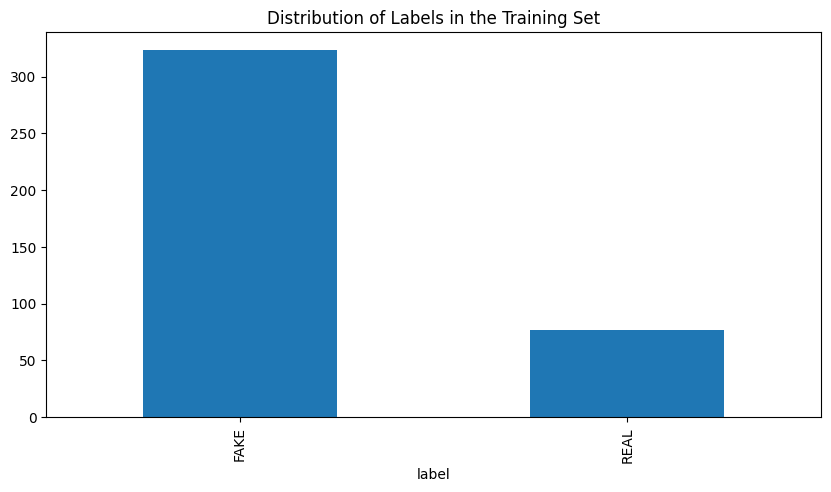

In [6]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(10, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

In [7]:
def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()
        uniques.append(unique)
    tt['Uniques'] = uniques
    return(np.transpose(tt))

In [8]:
unique_values(train_sample_metadata)

,label,split,original
Total,400,400,323
Uniques,2,1,209


In [9]:
def most_frequent_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    items = []
    vals = []
    for col in data.columns:
        itm = data[col].value_counts().index[0]
        val = data[col].value_counts().values[0]
        items.append(itm)
        vals.append(val)
    tt['Most frequent item'] = items
    tt['Frequency'] = vals
    tt['Percent from total'] = np.round(vals / total * 100, 3)
    return(np.transpose(tt))

In [10]:
most_frequent_values(train_sample_metadata)

,label,split,original
Total,400,400,323
Most frequent item,FAKE,train,atvmxvwyns.mp4
Frequency,323,400,6
Percent from total,80.75,100.0,1.858


In [11]:
original_counts = pd.DataFrame(train_sample_metadata['original'].value_counts())
original_counts.head(10)

,original
atvmxvwyns.mp4,6
meawmsgiti.mp4,6
qeumxirsme.mp4,5
kgbkktcjxf.mp4,5
fysyrqfguw.mp4,4
gjypopglvi.mp4,4
dzyuwjkjui.mp4,4
gipbyjfxfp.mp4,4
ywvlvpvroj.mp4,4
qtnjyomzwo.mp4,4


In [12]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(10).index)
fake_train_sample_video

['amowujxmzc.mp4',
 'emgjphonqb.mp4',
 'atzdznmder.mp4',
 'chzieimrwu.mp4',
 'avfitoutyn.mp4',
 'esnntzzajv.mp4',
 'eajlrktemq.mp4',
 'coadfnerlk.mp4',
 'brhalypwoo.mp4',
 'avywawptfc.mp4']

In [13]:
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(10).index)    # returning the index value which is video name
real_train_sample_video

['anpuvshzoo.mp4',
 'brwrlczjvi.mp4',
 'bddjdhzfze.mp4',
 'axntxmycwd.mp4',
 'cppdvdejkc.mp4',
 'abarnvbtwb.mp4',
 'cizlkenljw.mp4',
 'drcyabprvt.mp4',
 'edyncaijwx.mp4',
 'ciyoudyhly.mp4']

In [14]:
def display_image_from_video(video_path):
    '''
    input: video_path - path for video
    process:
    1. perform a video capture from the video
    2. read the image
    3. display the image
    '''
    capture_image = cv.VideoCapture(video_path) 
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv.cvtColor(frame, cv.COLOR_BGR2RGB)   # converting the frame color to RGB
    ax.imshow(frame)

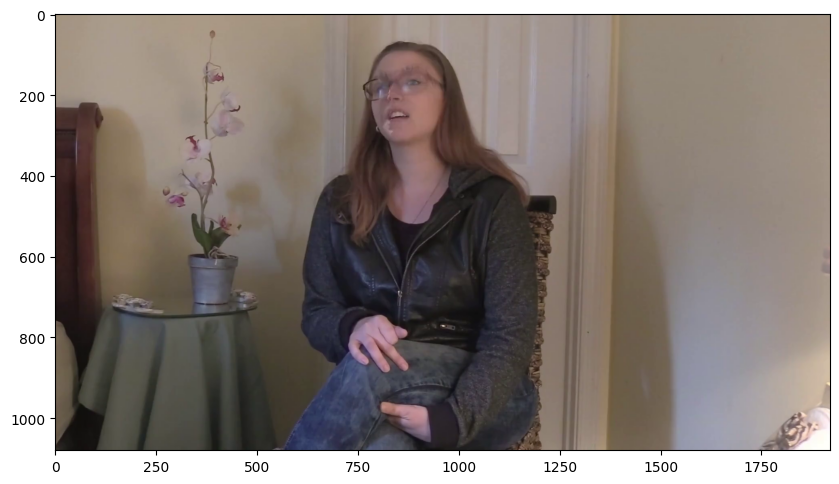

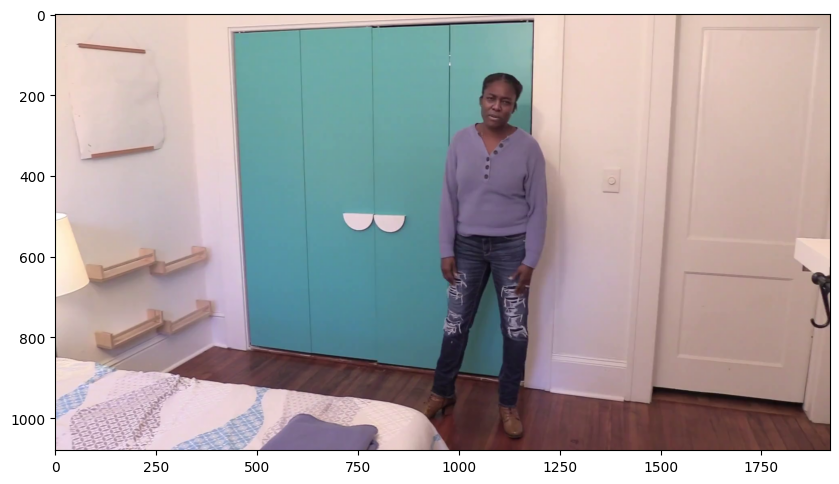

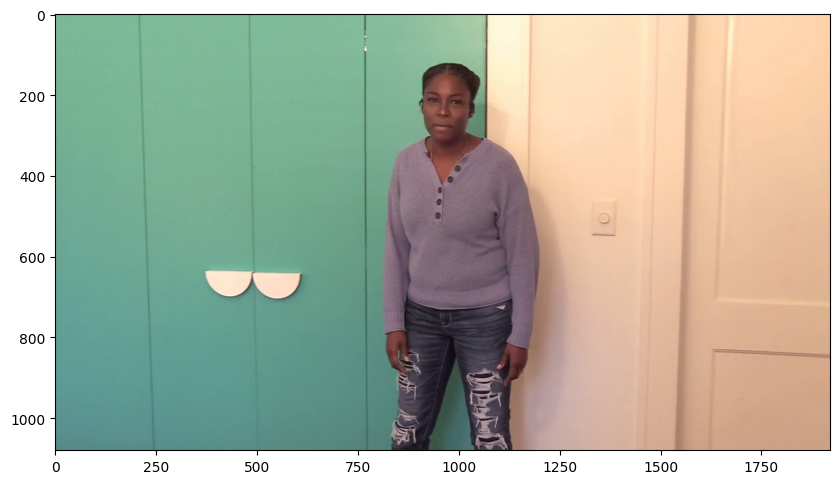

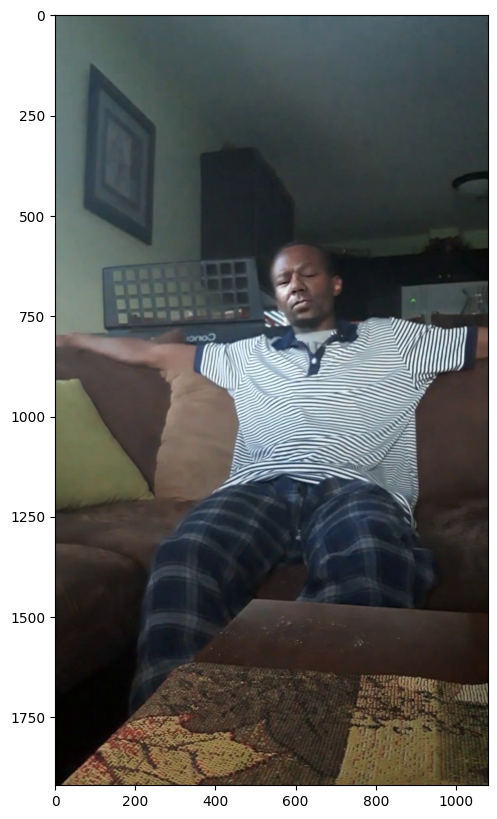

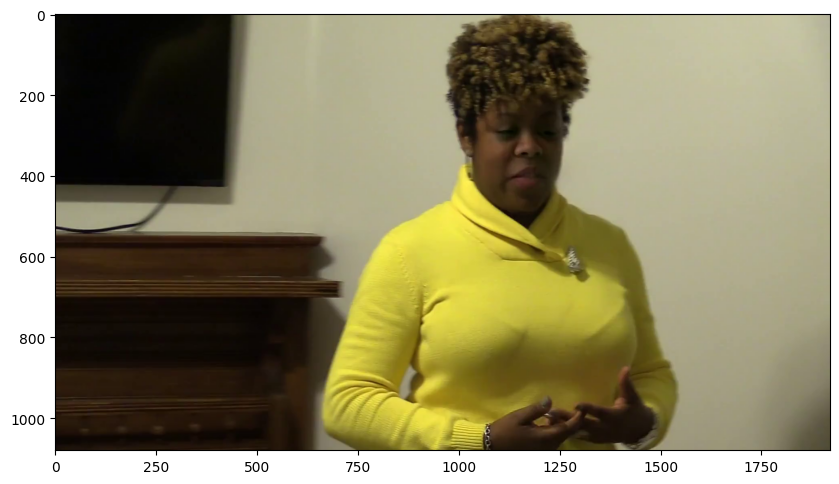

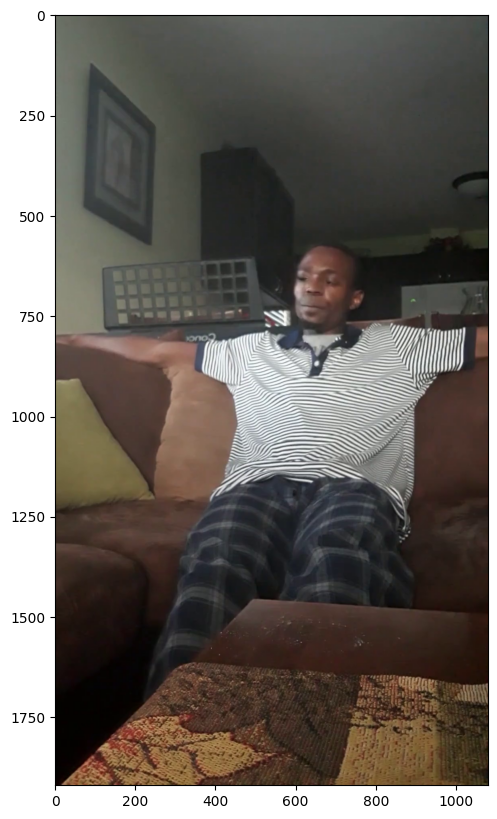

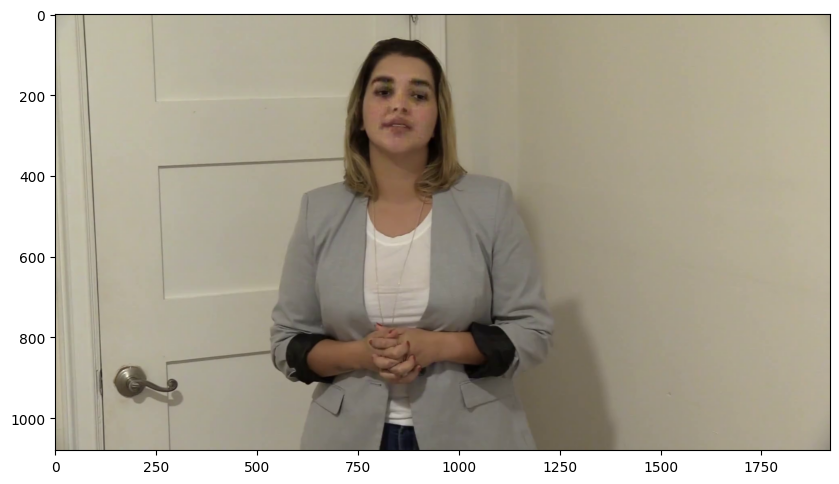

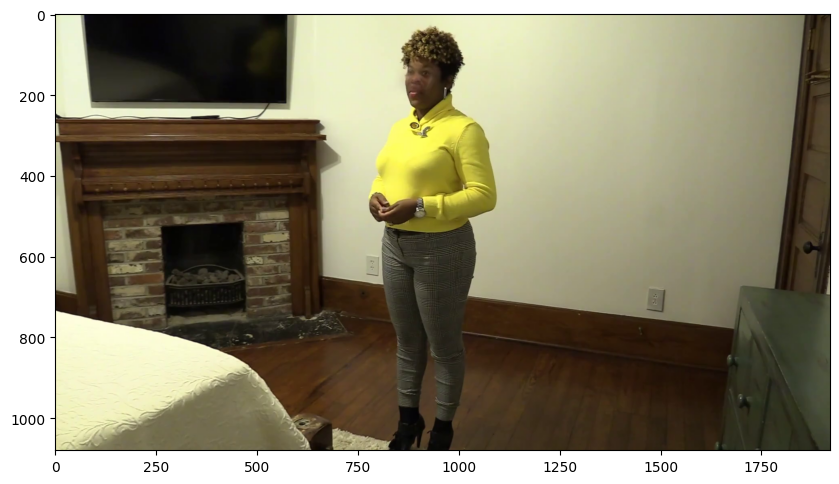

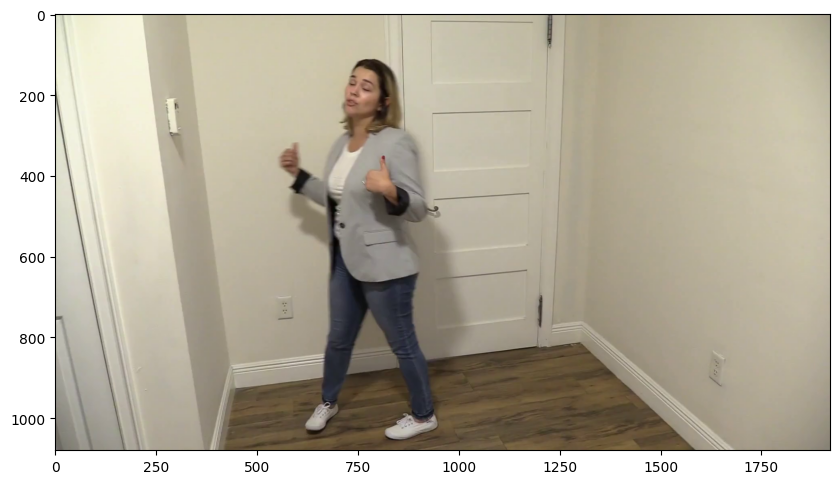

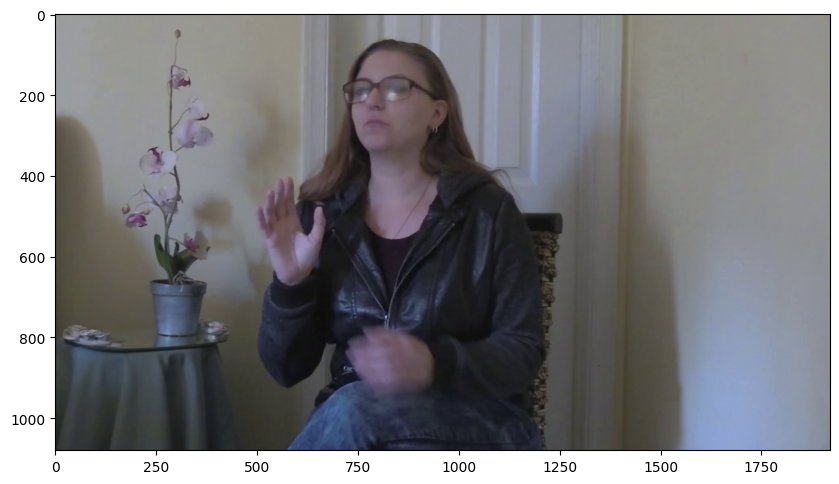

In [15]:
for video in fake_train_sample_video:
  display_image_from_video(os.path.join("train/"+video))
  print()



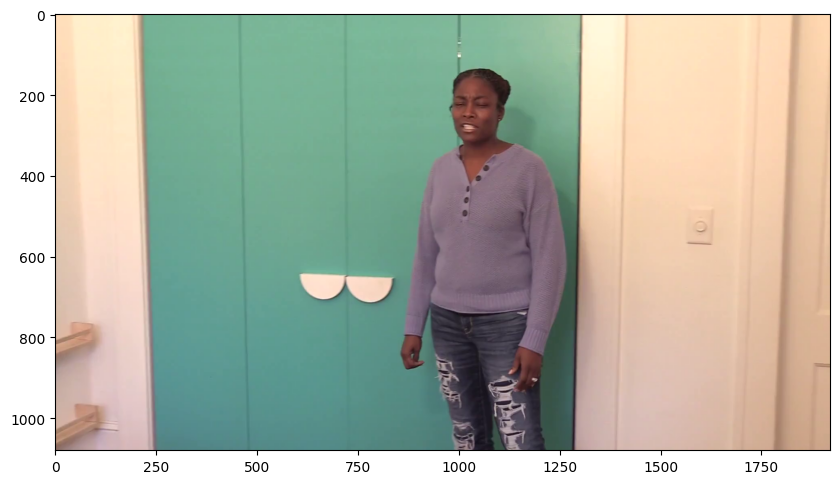

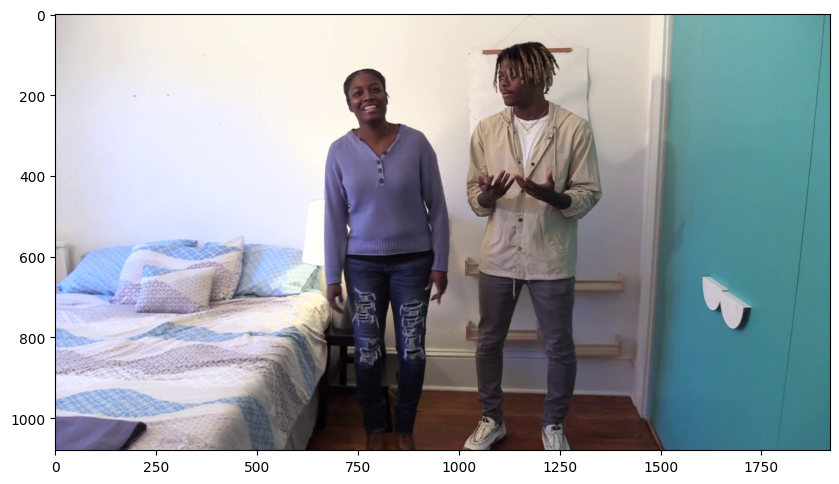

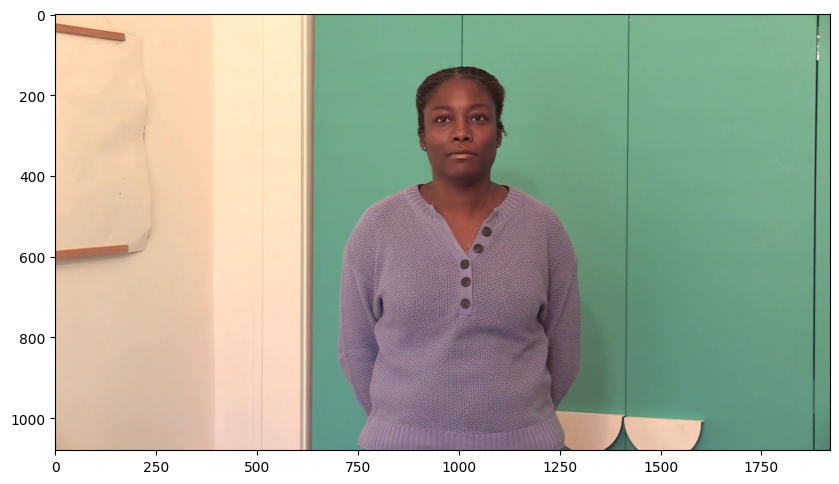

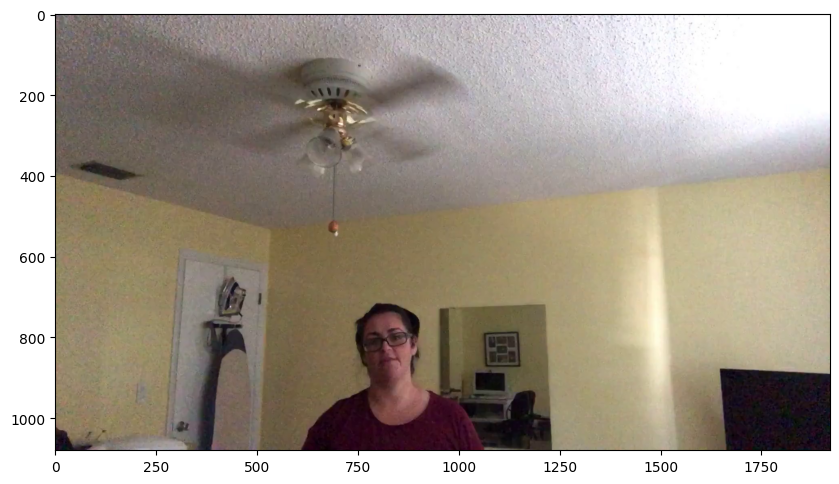

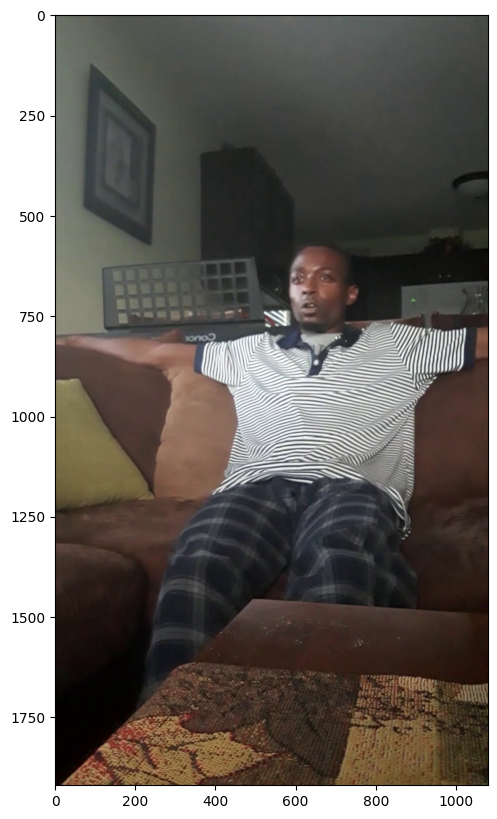

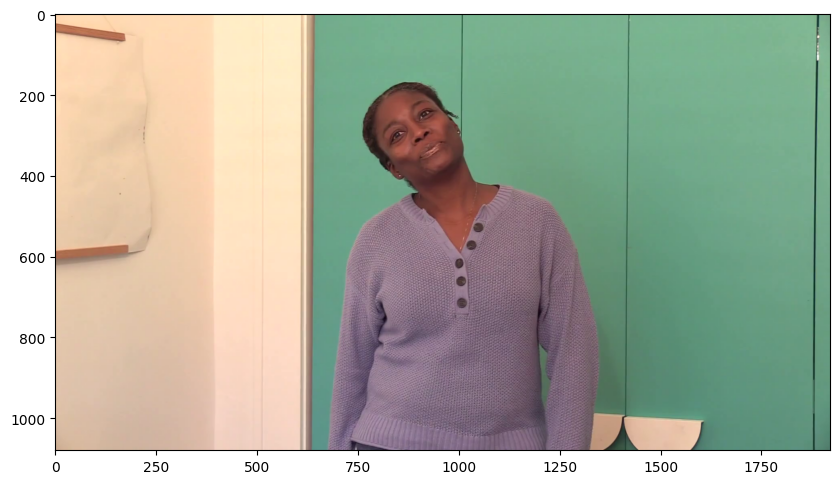

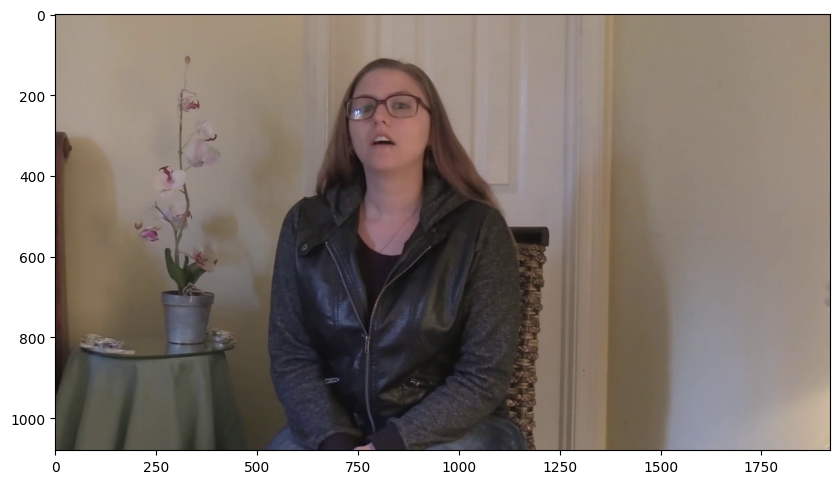

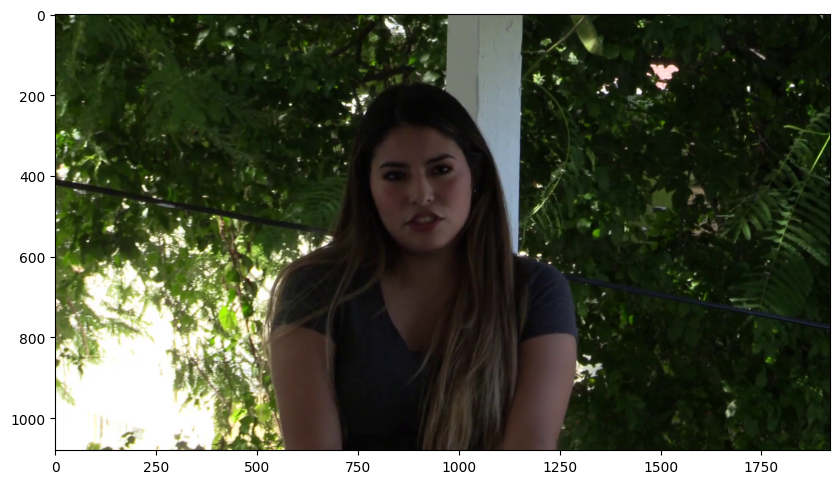

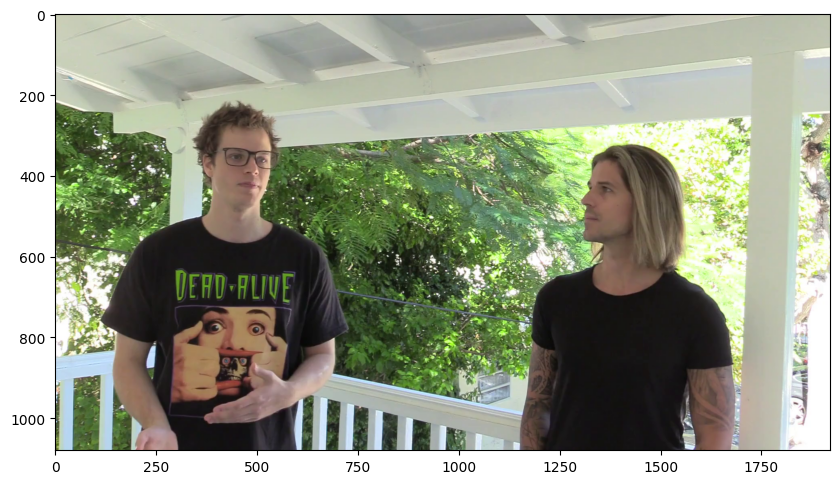

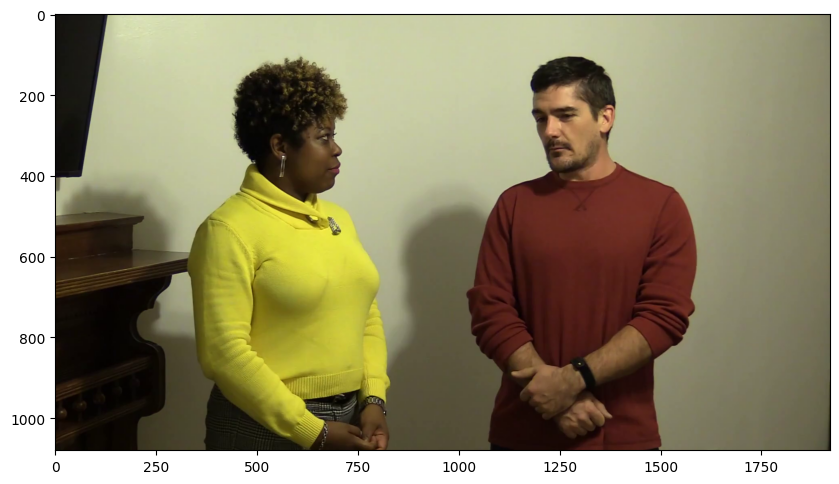

In [16]:
for video in real_train_sample_video:
  display_image_from_video(os.path.join("train/"+video))
  print()

In [17]:
videos = glob.glob('train/*.mp4')
frame_cnt = []
for video in videos:
  capture = cv.VideoCapture(video)
  frame_cnt.append(int(capture.get(cv.CAP_PROP_FRAME_COUNT)))
print("Frames: ",frame_cnt)
print("Avg Frame per video: ", np.mean(frame_cnt))  

Frames:  [300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 298, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 

In [18]:
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 10
MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

In [19]:
def crop_center_square(frame):
    y, x = frame.shape[:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]

def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv.VideoCapture(path)
    frames = []

    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break

            frame = crop_center_square(frame)
            frame = cv.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    
    return np.array(frames)

In [20]:
import tensorflow as tf
from tensorflow import keras

def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )

    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = build_feature_extractor()

87910968/87910968 [==============================] - 34s 0us/step


In [21]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels == "FAKE").astype(int)

    # `frame_masks` and `frame_features` are what we will feed to our sequence model.
    # `frame_masks` will contain a bunch of booleans denoting if a timestep is
    # masked with padding or not.
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx, path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )
        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(
                        batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

        frame_features[idx, ] = temp_frame_features.squeeze()
        frame_masks[idx, ] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels


In [22]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(train_sample_metadata, test_size=0.2, random_state=42, stratify=train_sample_metadata['label'])

print(Train_set.shape, Test_set.shape)



(320, 3) (80, 3)


In [24]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "train")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")


1/1 [==============================] - 4s 4s/step
Frame features in train set: (320, 20, 2048)
Frame masks in train set: (320, 20)


In [25]:
frame_features_input = keras.Input(shape=(MAX_SEQ_LENGTH, NUM_FEATURES))

mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

x = keras.layers.GRU(64, return_sequences=True)(frame_features_input, mask=mask_input)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.GRU(32, return_sequences=True)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.GRU(16)(x)
x = keras.layers.Dropout(0.5)(x)  # Increased dropout
x = keras.layers.Dense(32, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)  # Added another dropout layer
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

# Use a lower learning rate and different optimizer
optimizer = keras.optimizers.Adam(learning_rate=1e-4)

model.compile(loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"])
model.summary()

# Include Early Stopping to prevent overfitting
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = keras.callbacks.ModelCheckpoint('model_checkpoint.weights.h5', save_weights_only=True, save_best_only=True)

history = model.fit(
    [train_data[0], train_data[1]],
    train_labels,
    validation_data=([test_data[0], test_data[1]], test_labels),
    callbacks=[checkpoint, early_stopping],
    epochs=EPOCHS,
    batch_size=16
)


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 20, 2048)]           0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 20)]                 0         []                            
                                                                                                  
 gru (GRU)                   (None, 20, 64)               405888    ['input_3[0][0]',             
                                                                     'input_4[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 20, 64)               256       ['gru[0][0]']             

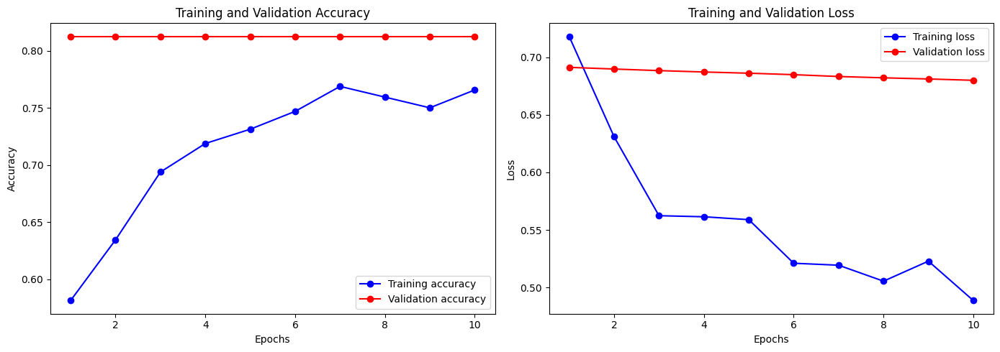

In [26]:
import matplotlib.pyplot as plt

# Extract the data from the history object
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(accuracy) + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, accuracy, 'bo-', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'ro-', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [27]:
import os
import glob
import numpy as np
import imageio
from IPython.display import HTML
from base64 import b64encode

# Assumes these are defined elsewhere:
# MAX_SEQ_LENGTH, NUM_FEATURES, feature_extractor, model, load_video

# Define folders
DATA_FOLDER = '.'         # or wherever your test folder is located
TEST_FOLDER = 'test'

# Get all test video file paths
test_videos = glob.glob(os.path.join(TEST_FOLDER, '*.mp4'))

# Prepare a single video for prediction
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

# Predict using the model
def sequence_prediction(path):
    frames = load_video(path)  # Direct path
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

# Play video in notebook (optional utility)
def play_video(video_path, base_folder):
    full_path = os.path.join(base_folder, video_path)
    mp4 = open(full_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML(f"""<video width=400 controls><source src="{data_url}" type="video/mp4"></video>""")

# Convert to GIF for animation (optional utility)
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

# Run prediction on a random test video
test_video_path = np.random.choice(test_videos)
print(f"Test video path: {test_video_path}")

prediction = sequence_prediction(test_video_path)

if prediction >= 0.5:
    print("The predicted class of the video is FAKE")
else:
    print("The predicted class of the video is REAL")

# Play the selected test video
play_video(test_video_path, ".")


Test video path: test\didzujjhtg.mp4
1/1 [==============================] - 8s 8s/step
The predicted class of the video is FAKE


1/1 [==============================] - 0s 41ms/step


<Figure size 600x600 with 0 Axes>

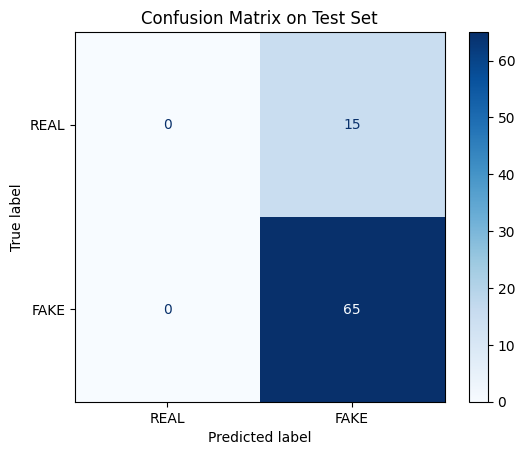

In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

labels = Test_set['label'].values  # These are your ground truth labels
y_true = np.array(labels == "FAKE").astype(int)

y_pred = []

for video_name in Test_set.index:
    video_path = os.path.join('train', video_name)  # Construct full path
    prediction = sequence_prediction(video_path)
    predicted_label = 1 if prediction >= 0.5 else 0  # Assuming 1 = FAKE, 0 = REAL
    y_pred.append(predicted_label)

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["REAL", "FAKE"])

plt.figure(figsize=(6, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix on Test Set")
plt.show()

In [30]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")

Accuracy:  0.8125
Precision: 0.8125
Recall:    1.0000
F1 Score:  0.8966


In [31]:
model.save('deepfake_video_model.h5')

c:\users\ishit\appdata\local\programs\python\python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
